# <a id="inicio"></a> Exercícios Aprendizado Nao Supervisionado

-----

### **Autor:** Glauco Lauria Marques Filho

-----

# <a id="resumo"></a> Resumo 

#### Este arquivo contém a resolução dos exercícios da Aula 7 do curso CEDS-808: Aprendizado de Máquina. 

# <a id="sumario"></a> Sumário


* [Início](#inicio)
* [Resumo](#resumo)
* [Sumário](#sumario)
* [Importação de Requisitos](#requisitos)

- 1.a [Dataset Aggregation](#dataset_1)
- 1.a.I [Dataset Aggregation - K-means](#dataset_1_1)
- 1.a.II [Dataset Aggregation - Average Linkage](#dataset_1_2)
- 1.a.III [Dataset Aggregation - DBSCAN](#dataset_1_3)
- 1.a.IV [Dataset Aggregation - Melhores Resultados](#dataset_1_4)

<br>

- 2.a [Dataset D31](#dataset_2)
- 2.a.I [Dataset D31 - K-means](#dataset_2_1)
- 2.a.II [Dataset D31 - Average Linkage](#dataset_2_2)
- 2.a.III [Dataset D31 - DBSCAN](#dataset_2_3)
- 2.a.IV [Dataset D31 - Melhores Resultados](#dataset_2_4)

<br>

- 3.a [Dataset Pathbased](#dataset_3)
- 3.a.I [Dataset Pathbased - K-means](#dataset_3_1)
- 3.a.II [Dataset Pathbased - Average Linkage](#dataset_3_2)
- 3.a.III [Dataset Pathbased - DBSCAN](#dataset_3_3)
- 3.a.IV [Dataset Pathbased - Melhores Resultados](#dataset_3_4)

<br>

- 4.a [Dataset Flame](#dataset_4)
- 4.a.I [Dataset Flame - K-means](#dataset_4_1)
- 4.a.II [Dataset Flame - Average Linkage](#dataset_4_2)
- 4.a.III [Dataset Flame - DBSCAN](#dataset_4_3)
- 4.a.IV [Dataset Flame - Melhores Resultados](#dataset_4_4)

# <a id="requisitos"></a> Importação de Requisitos

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# <a id="dataset_1"></a> 1.a. Dataset Aggregation

In [44]:
df_aggregation = pd.read_csv("aggregation.csv", sep=";", names=["x1","x2","y"])

In [45]:
df_aggregation

,x1,x2,y
0,15.55,28.65,2
1,14.90,27.55,2
2,14.45,28.35,2
3,14.15,28.80,2
4,13.75,28.05,2
...,...,...,...
783,7.80,3.35,5
784,8.05,2.75,5
785,8.50,3.25,5
786,8.10,3.55,5


In [46]:
df_aggregation_X = df_aggregation.drop("y", axis=1)
df_aggregation_Y = df_aggregation["y"]

# <a id="dataset_1_1"></a> 1.a.I Dataset Aggregation - K-means

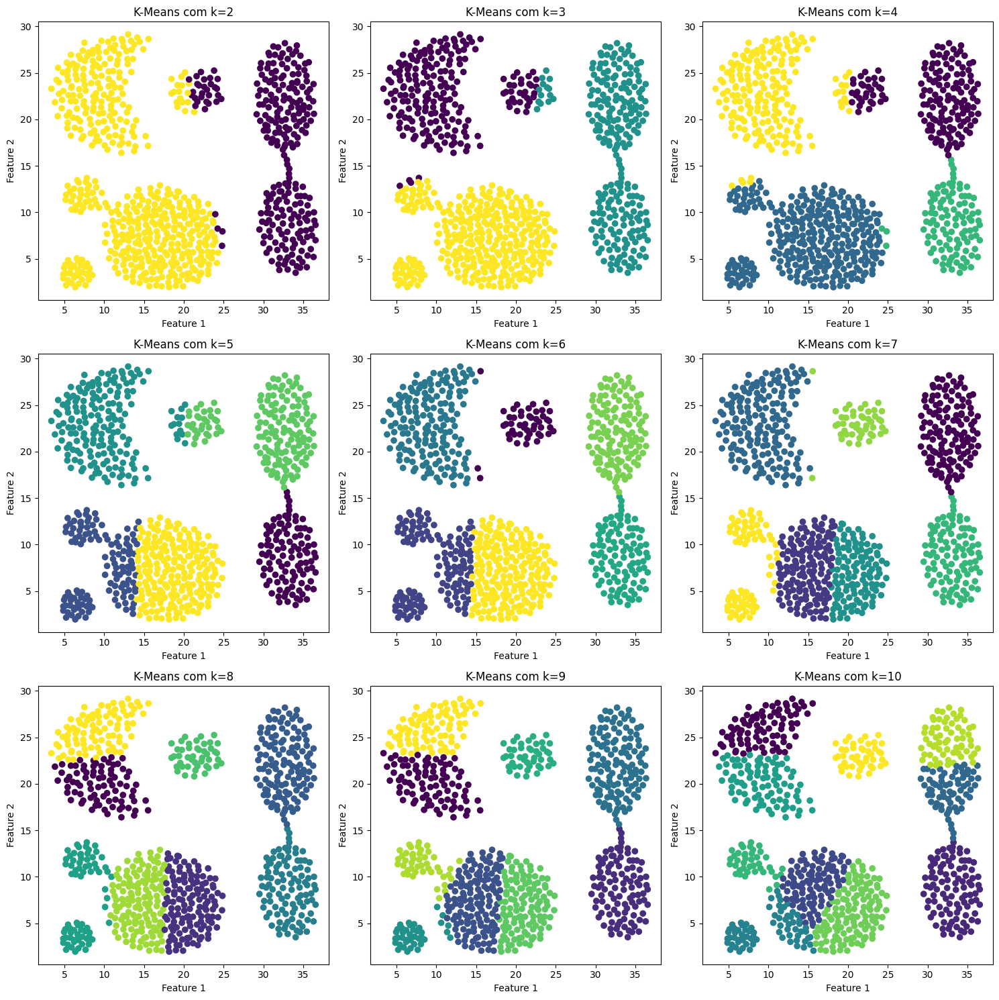

In [47]:
# Variando o número de clusters de 2 a 10
fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for k in range(2, 11):
    # Criando o objeto KMeans
    kmeans = KMeans(n_clusters=k)

    # Aplicando o algoritmo K-Means
    clusters = kmeans.fit_predict(df_aggregation_X)

    # Plotando os clusters
    ax = axs[(k-2)//3][(k-2)%3]
    ax.scatter(df_aggregation_X.iloc[:, 0], df_aggregation_X.iloc[:, 1], c=clusters, cmap='viridis')
    ax.set_title(f'K-Means com k={k}')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

plt.tight_layout()
plt.show()

# <a id="dataset_1_2"></a> 1.a.II Dataset Aggregation - Average Linkage

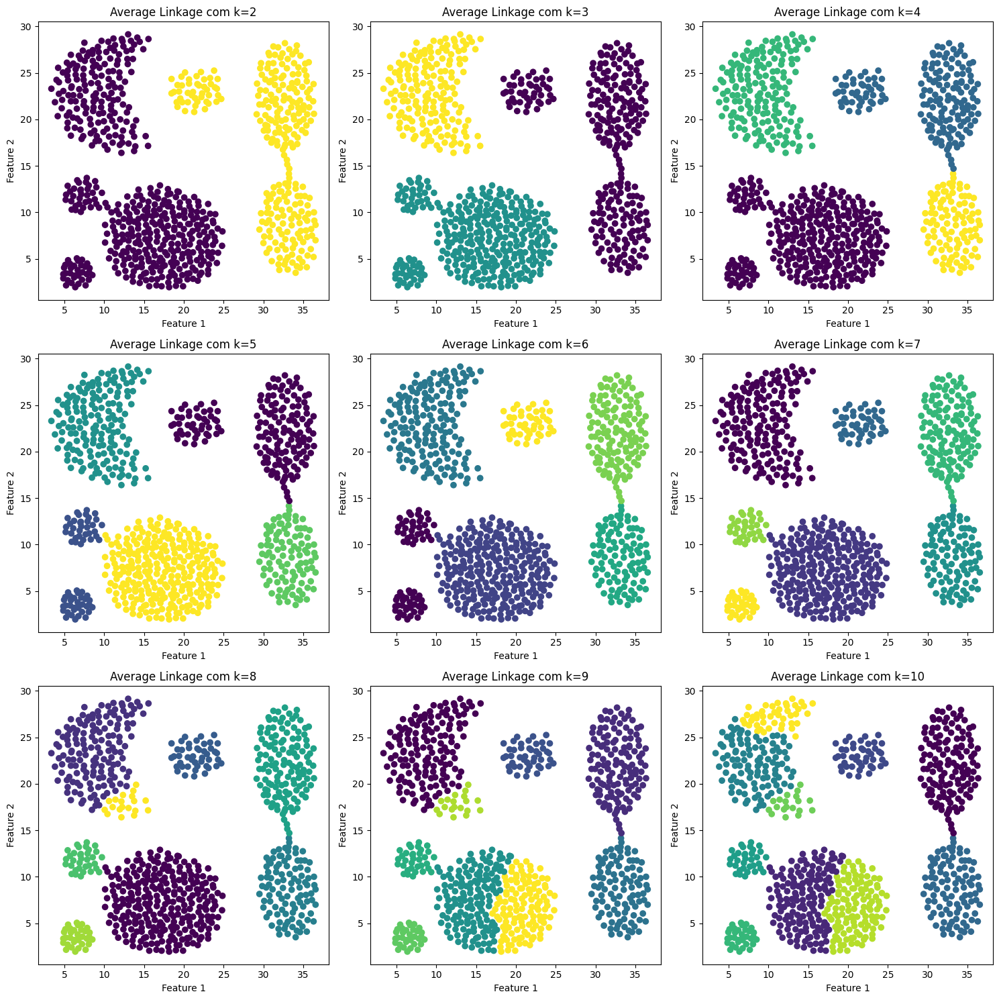

In [48]:
# Variando o número de clusters de 2 a 10
fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for k in range(2, 11):
    # Criando o objeto AgglomerativeClustering
    clustering = AgglomerativeClustering(n_clusters=k, linkage='average')

    # Aplicando o algoritmo AgglomerativeClustering
    clusters = clustering.fit_predict(df_aggregation_X)

    # Plotando os clusters
    ax = axs[(k-2)//3][(k-2)%3]
    ax.scatter(df_aggregation_X.iloc[:, 0], df_aggregation_X.iloc[:, 1], c=clusters, cmap='viridis')
    ax.set_title(f'Average Linkage com k={k}')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

plt.tight_layout()
plt.show()

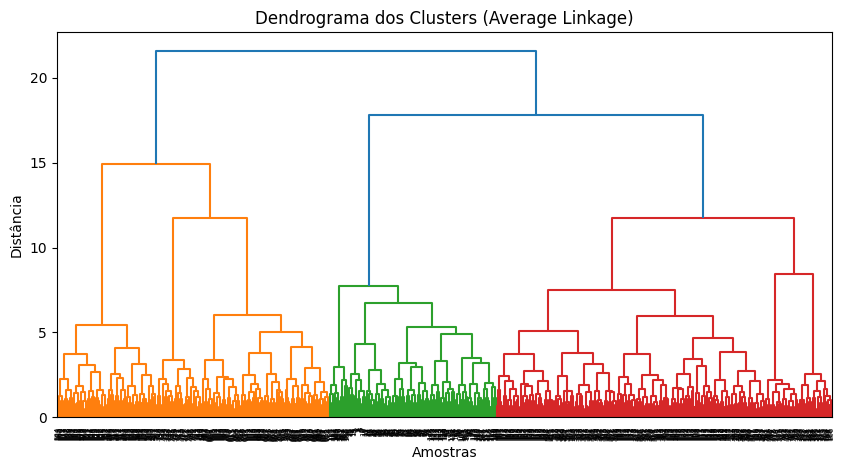

In [49]:
# Aplicando o algoritmo de ligação única
clustering = AgglomerativeClustering(n_clusters=7, linkage='average')
clusters = clustering.fit_predict(df_aggregation_X)

# Calculando a matriz de ligação com o algoritmo de ligação média
Z = linkage(df_aggregation_X, method='average')

# Plotando o dendrograma
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title('Dendrograma dos Clusters (Average Linkage)')
plt.xlabel('Amostras')
plt.ylabel('Distância')
plt.show()

# <a id="dataset_1_3"></a> 1.a.III Dataset Aggregation - DBSCAN

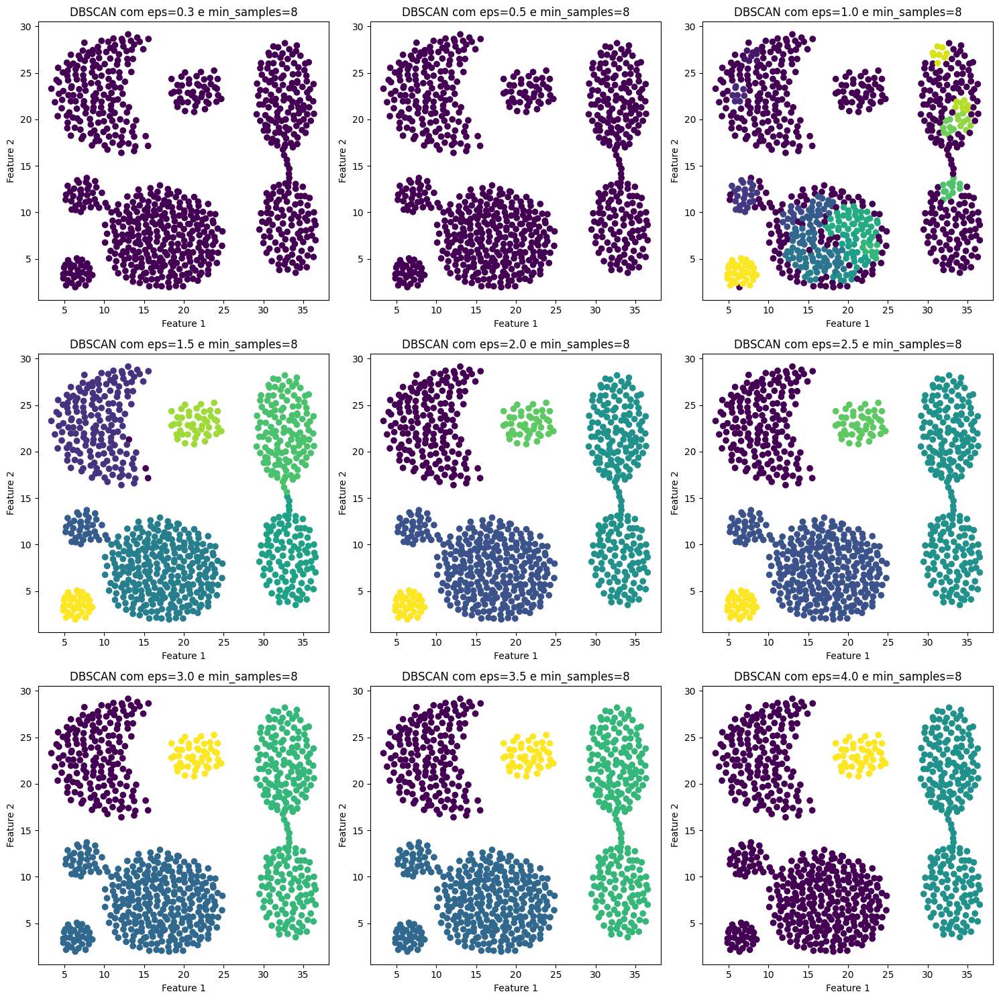

In [50]:
fig, axs = plt.subplots(3, 3, figsize=(15, 15))

epsilon_values = [0.3, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0]

for k in range(2, 11):

    dbscan = DBSCAN(eps=epsilon_values[k-2], min_samples=8)
    clusters = dbscan.fit_predict(df_aggregation_X)

    # Plotando os clusters
    ax = axs[(k-2)//3][(k-2)%3]
    ax.scatter(df_aggregation_X.iloc[:, 0], df_aggregation_X.iloc[:, 1], c=clusters, cmap='viridis')
    ax.set_title(f'DBSCAN com eps={epsilon_values[k-2]} e min_samples=8')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

plt.tight_layout()
plt.show()

# <a id="dataset_1_4"></a> 1.a.IV Dataset Aggregation - Melhores Resultados

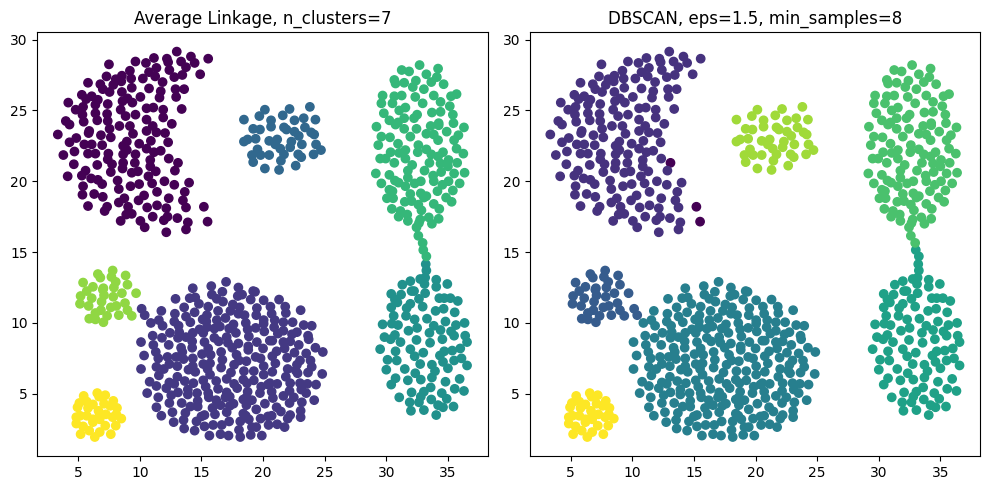

In [51]:
df_aggregation_X = df_aggregation_X.values

clustering = AgglomerativeClustering(n_clusters=7, linkage='average')
clusters_1 = clustering.fit_predict(df_aggregation_X)

dbscan = DBSCAN(eps=1.5, min_samples=8)
clusters_2 = dbscan.fit_predict(df_aggregation_X)

plt.figure(figsize=(10, 5))
plt.subplot(121)
plt.scatter(df_aggregation_X[:,0], df_aggregation_X[:,1], c=clusters_1, cmap='viridis')
plt.title('Average Linkage, n_clusters=7')

plt.subplot(122)
plt.scatter(df_aggregation_X[:,0], df_aggregation_X[:,1], c=clusters_2, cmap='viridis')
plt.title('DBSCAN, eps=1.5, min_samples=8')

plt.tight_layout()
plt.show()


---

# <a id="dataset_2"></a> 2.a. Dataset D31

In [52]:
df_d31 = pd.read_csv("d31.csv", sep=";", names=["x1","x2","y"])

In [53]:
df_d31

,x1,x2,y
0,25.0514,5.7475,1
1,26.6614,7.3414,1
2,25.2653,6.2466,1
3,25.2285,4.7447,1
4,25.7529,5.1564,1
...,...,...,...
3095,5.1380,16.6150,31
3096,5.7360,16.9991,31
3097,5.2760,17.2475,31
3098,6.4444,16.2033,31


In [54]:
df_d31_X = df_d31.drop("y", axis=1)
df_d31_Y = df_d31["y"]

# <a id="dataset_2_1"></a> 2.a.I Dataset D31 - K-means

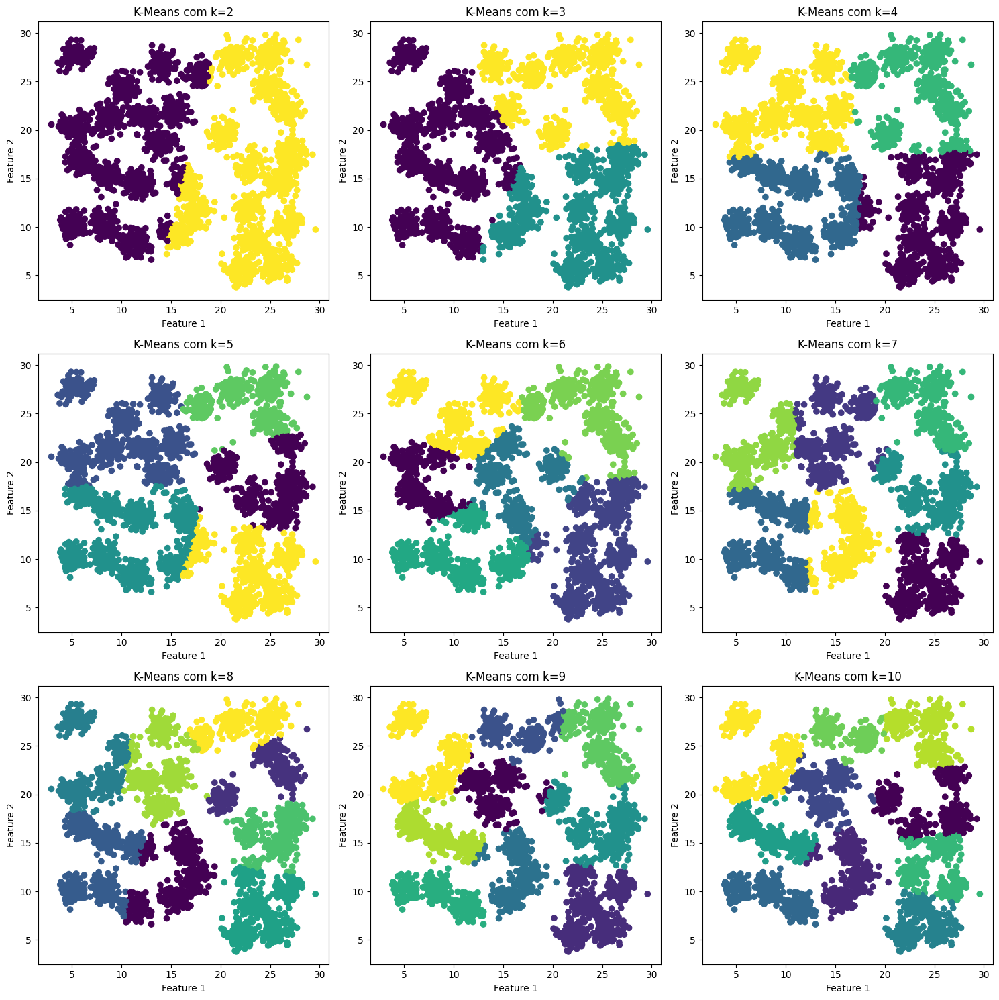

In [55]:
# Variando o número de clusters de 2 a 10
fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for k in range(2, 11):
    # Criando o objeto KMeans
    kmeans = KMeans(n_clusters=k)

    # Aplicando o algoritmo K-Means
    clusters = kmeans.fit_predict(df_d31_X)

    # Plotando os clusters
    ax = axs[(k-2)//3][(k-2)%3]
    ax.scatter(df_d31_X.iloc[:, 0], df_d31_X.iloc[:, 1], c=clusters, cmap='viridis')
    ax.set_title(f'K-Means com k={k}')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

plt.tight_layout()
plt.show()

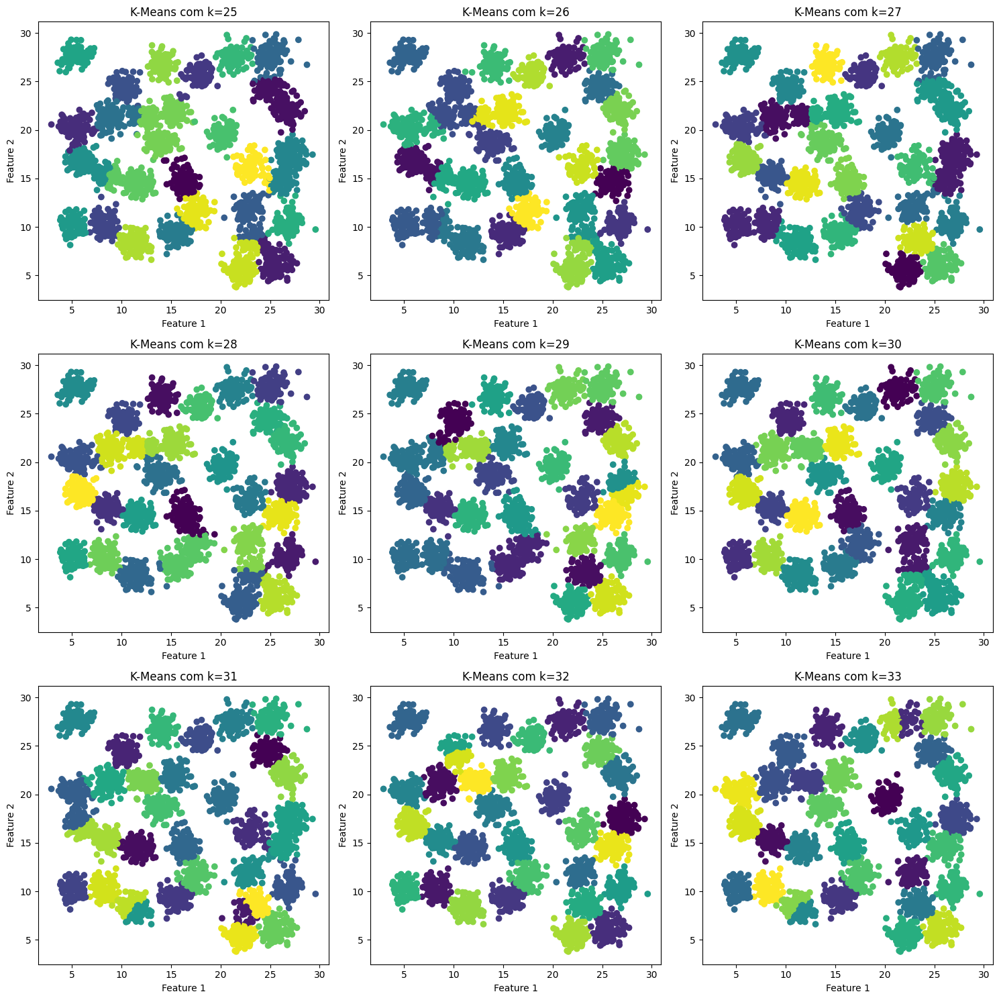

In [56]:
# Variando o número de clusters de 2 a 10
fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for k in range(25, 34):
    # Criando o objeto KMeans
    kmeans = KMeans(n_clusters=k)

    # Aplicando o algoritmo K-Means
    clusters = kmeans.fit_predict(df_d31_X)

    # Plotando os clusters
    ax = axs[(k-25)//3][(k-25)%3]
    ax.scatter(df_d31_X.iloc[:, 0], df_d31_X.iloc[:, 1], c=clusters, cmap='viridis')
    ax.set_title(f'K-Means com k={k}')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

plt.tight_layout()
plt.show()

# <a id="dataset_2_2"></a> 2.a.II Dataset D31 - Average Linkage

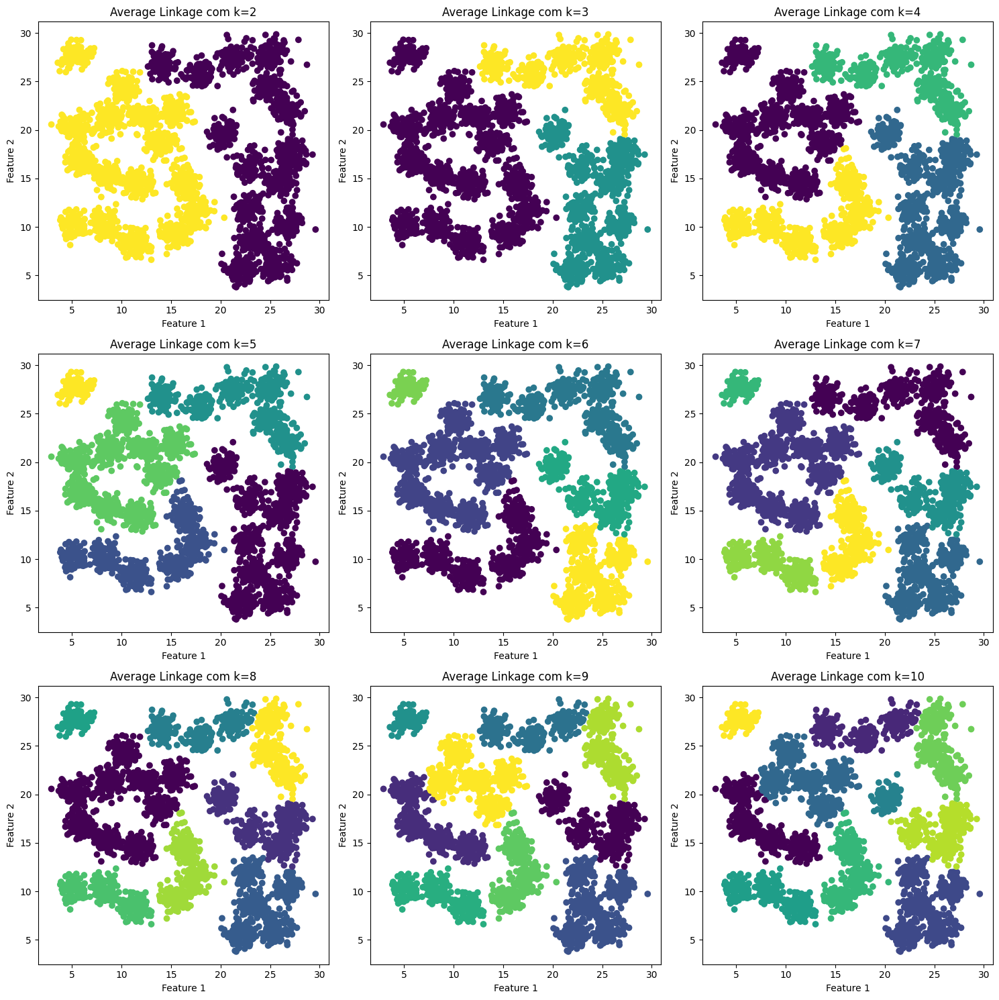

In [57]:
# Variando o número de clusters de 2 a 10
fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for k in range(2, 11):
    # Criando o objeto AgglomerativeClustering
    clustering = AgglomerativeClustering(n_clusters=k, linkage='average')

    # Aplicando o algoritmo AgglomerativeClustering
    clusters = clustering.fit_predict(df_d31_X)

    # Plotando os clusters
    ax = axs[(k-2)//3][(k-2)%3]
    ax.scatter(df_d31_X.iloc[:, 0], df_d31_X.iloc[:, 1], c=clusters, cmap='viridis')
    ax.set_title(f'Average Linkage com k={k}')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

plt.tight_layout()
plt.show()

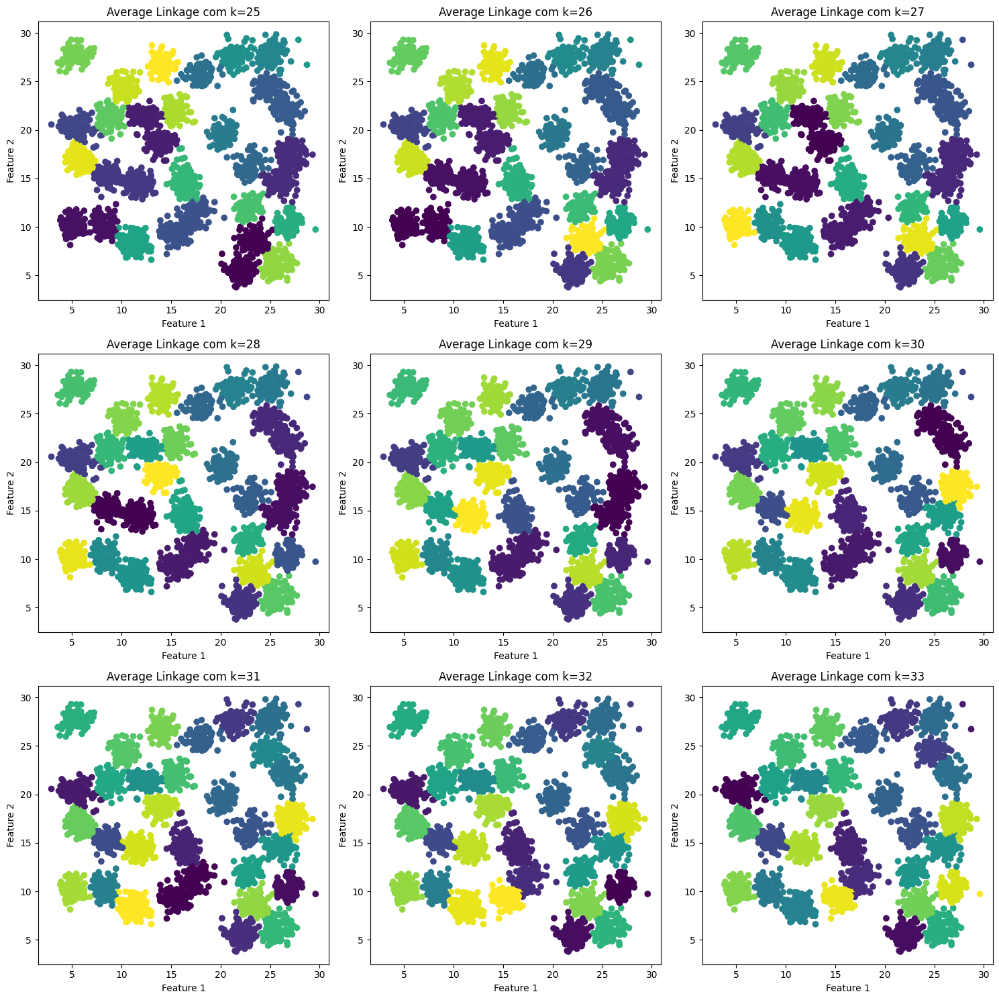

In [58]:
# Variando o número de clusters de 2 a 10
fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for k in range(25, 34):
    # Criando o objeto AgglomerativeClustering
    clustering = AgglomerativeClustering(n_clusters=k, linkage='average')

    # Aplicando o algoritmo AgglomerativeClustering
    clusters = clustering.fit_predict(df_d31_X)

    # Plotando os clusters
    ax = axs[(k-25)//3][(k-34)%3]
    ax.scatter(df_d31_X.iloc[:, 0], df_d31_X.iloc[:, 1], c=clusters, cmap='viridis')
    ax.set_title(f'Average Linkage com k={k}')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

plt.tight_layout()
plt.show()

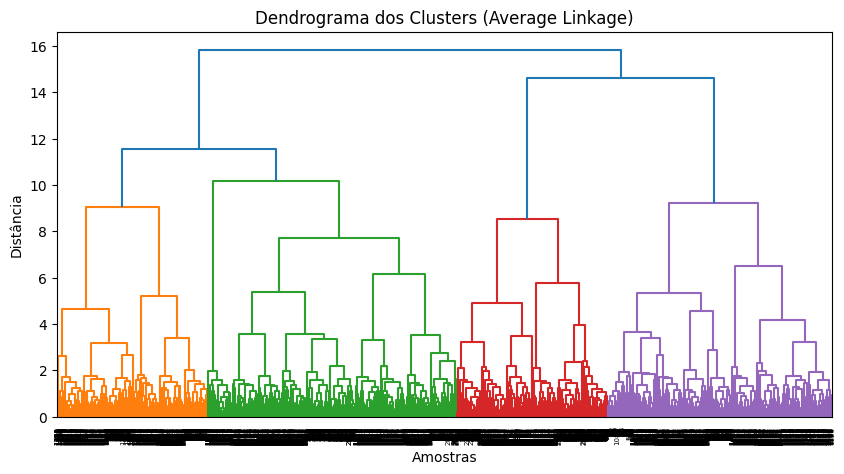

In [59]:
# Aplicando o algoritmo de ligação única
clustering = AgglomerativeClustering(n_clusters=31, linkage='average')
clusters = clustering.fit_predict(df_d31_X)

# Calculando a matriz de ligação com o algoritmo de ligação média
Z = linkage(df_d31_X, method='average')

# Plotando o dendrograma
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title('Dendrograma dos Clusters (Average Linkage)')
plt.xlabel('Amostras')
plt.ylabel('Distância')
plt.show()

# <a id="dataset_2_3"></a> 2.a.III Dataset D31 - DBSCAN

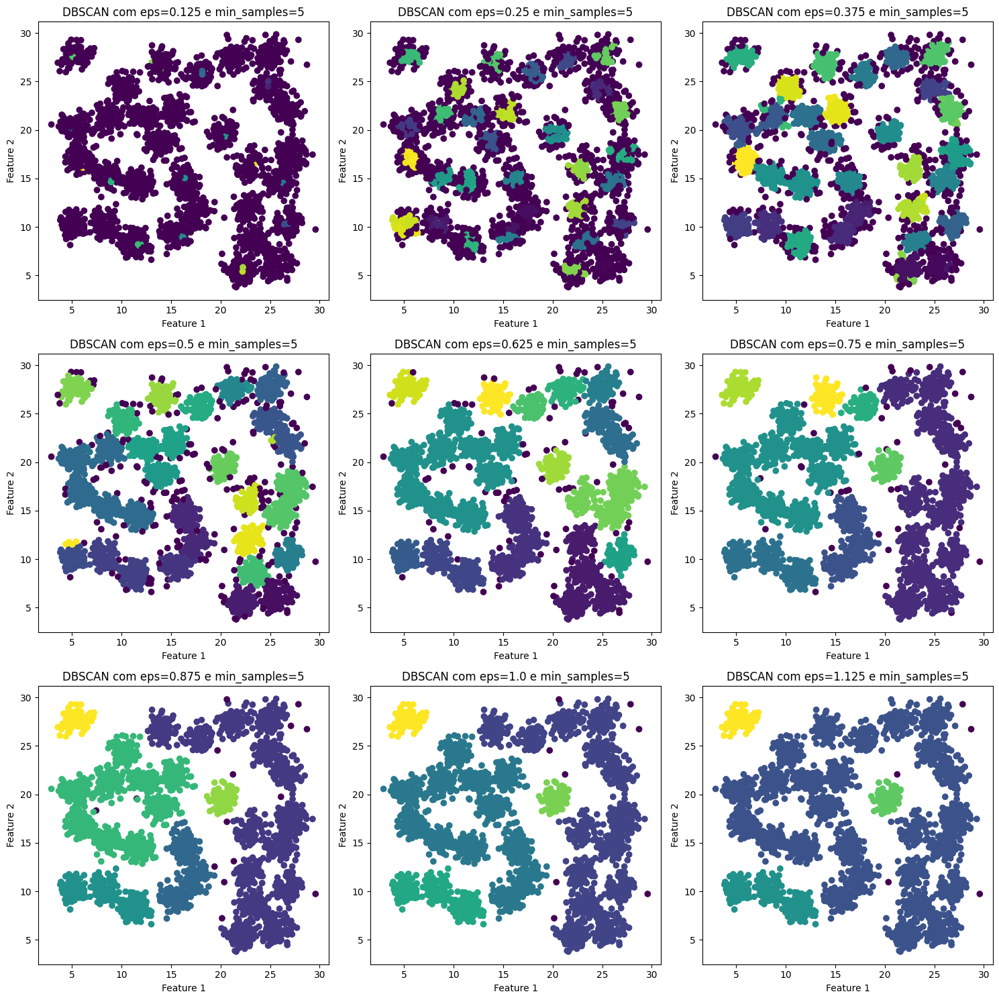

In [60]:
fig, axs = plt.subplots(3, 3, figsize=(15, 15))

epsilon_values = list(range(1,10,1))
for k in range(2, 11):

    dbscan = DBSCAN(eps=(epsilon_values[k-2])/8, min_samples=5)
    clusters = dbscan.fit_predict(df_d31_X)

    # Plotando os clusters
    ax = axs[(k-2)//3][(k-2)%3]
    ax.scatter(df_d31_X.iloc[:, 0], df_d31_X.iloc[:, 1], c=clusters, cmap='viridis')
    ax.set_title(f'DBSCAN com eps={epsilon_values[k-2]/8} e min_samples=5')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

plt.tight_layout()
plt.show()

# <a id="dataset_2_4"></a> 2.a.IV Dataset D31 - Melhores Resultados

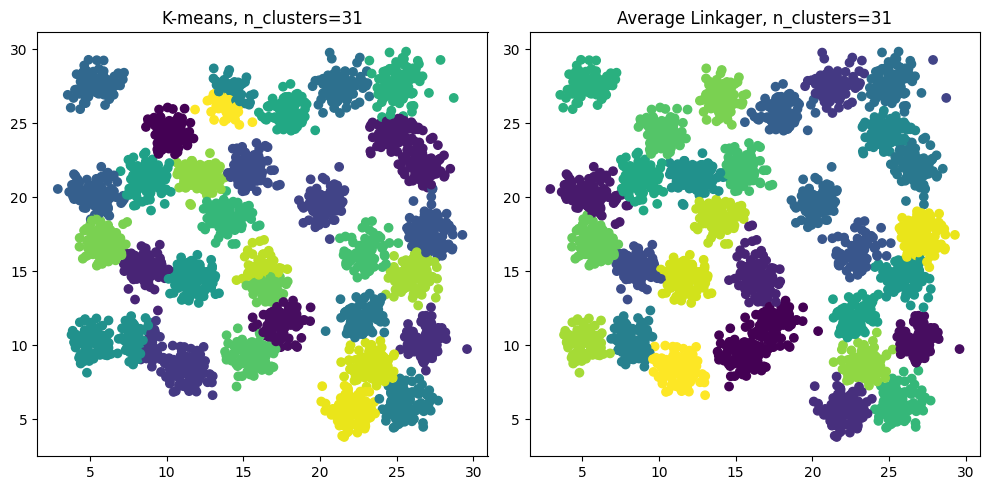

In [61]:
df_d31_X = df_d31_X.values
clustering = KMeans(n_clusters=31)
clusters_1 = clustering.fit_predict(df_d31_X)

clustering = AgglomerativeClustering(n_clusters=31, linkage='average')
clusters_2 = clustering.fit_predict(df_d31_X)

plt.figure(figsize=(10, 5))
plt.subplot(121)
plt.scatter(df_d31_X[:,0], df_d31_X[:,1], c=clusters_1, cmap='viridis')
plt.title('K-means, n_clusters=31')

plt.subplot(122)
plt.scatter(df_d31_X[:,0], df_d31_X[:,1], c=clusters_2, cmap='viridis')
plt.title('Average Linkager, n_clusters=31')

plt.tight_layout()
plt.show()


---

# <a id="dataset_3"></a> 3.a. Dataset Pathbased

In [62]:
df_pathbased = pd.read_csv("pathbased.csv", sep=";", names=["x1","x2","y"])

In [63]:
df_pathbased

,x1,x2,y
0,11.25,5.05,1
1,10.95,4.70,1
2,9.85,5.80,1
3,9.80,5.75,1
4,9.15,6.80,1
...,...,...,...
295,17.50,18.05,2
296,16.65,17.50,2
297,15.45,17.30,2
298,15.45,17.80,2


In [64]:
df_pathbased_X = df_pathbased.drop("y", axis=1)
df_pathbased_Y = df_pathbased["y"]

# <a id="dataset_3_1"></a> 3.a.I Dataset Pathbased - K-means

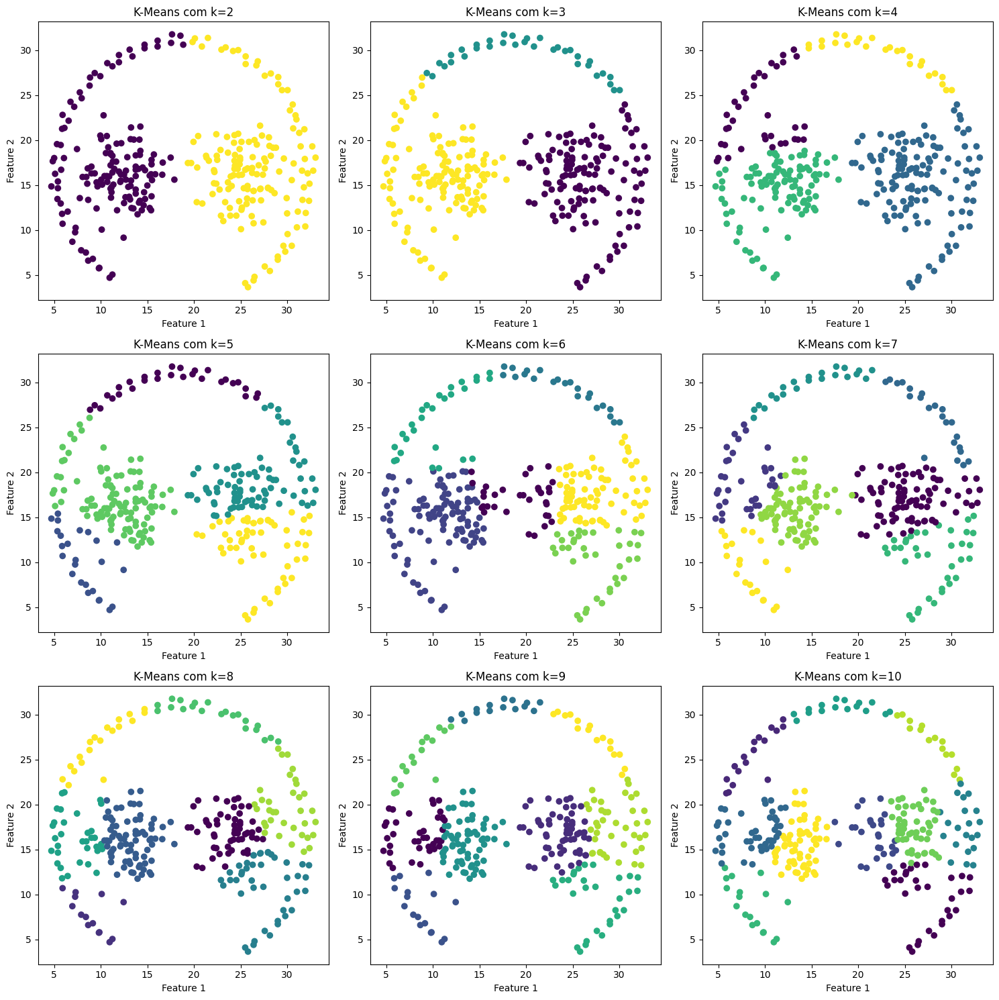

In [65]:
# Variando o número de clusters de 2 a 10
fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for k in range(2, 11):
    # Criando o objeto KMeans
    kmeans = KMeans(n_clusters=k)

    # Aplicando o algoritmo K-Means
    clusters = kmeans.fit_predict(df_pathbased_X)

    # Plotando os clusters
    ax = axs[(k-2)//3][(k-2)%3]
    ax.scatter(df_pathbased_X.iloc[:, 0], df_pathbased_X.iloc[:, 1], c=clusters, cmap='viridis')
    ax.set_title(f'K-Means com k={k}')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

plt.tight_layout()
plt.show()

# <a id="dataset_3_2"></a> 3.a.II Dataset Pathbased - Average Linkage

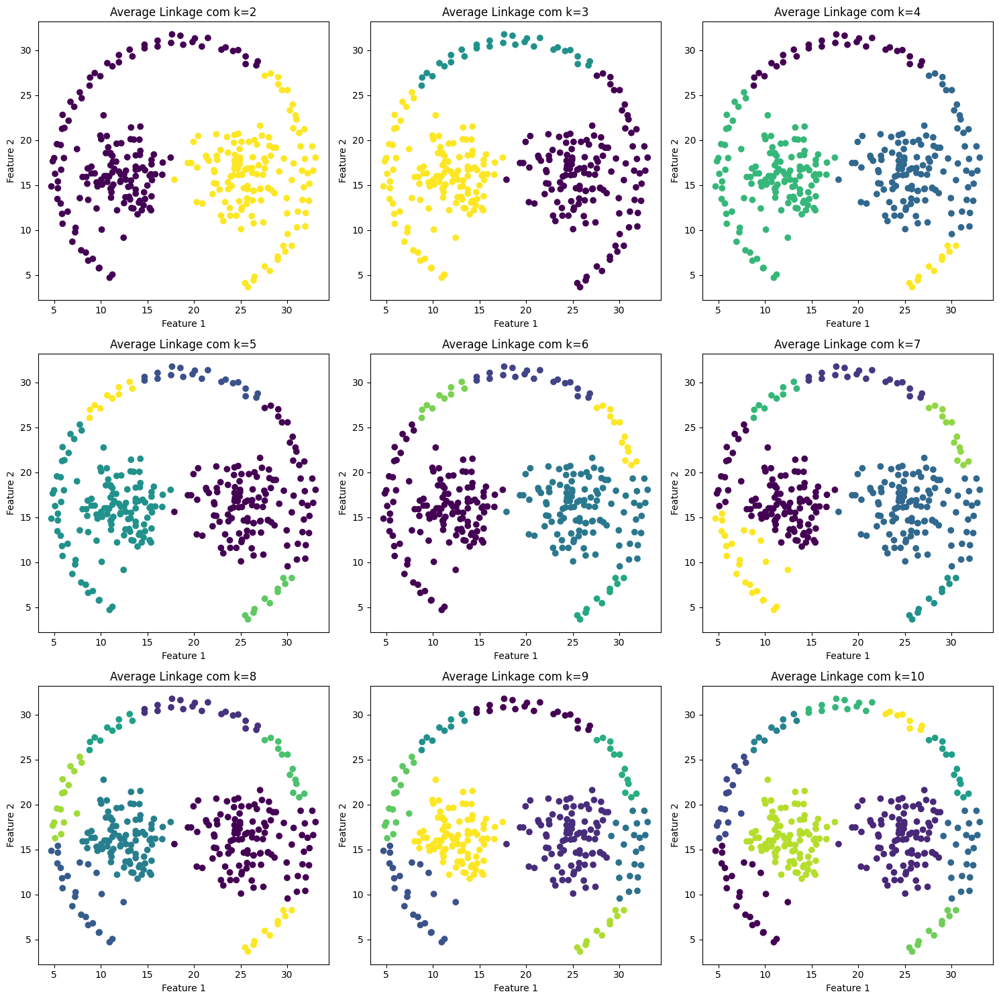

In [66]:
# Variando o número de clusters de 2 a 10
fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for k in range(2, 11):
    # Criando o objeto AgglomerativeClustering
    clustering = AgglomerativeClustering(n_clusters=k, linkage='average')

    # Aplicando o algoritmo AgglomerativeClustering
    clusters = clustering.fit_predict(df_pathbased_X)

    # Plotando os clusters
    ax = axs[(k-2)//3][(k-2)%3]
    ax.scatter(df_pathbased_X.iloc[:, 0], df_pathbased_X.iloc[:, 1], c=clusters, cmap='viridis')
    ax.set_title(f'Average Linkage com k={k}')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

plt.tight_layout()
plt.show()

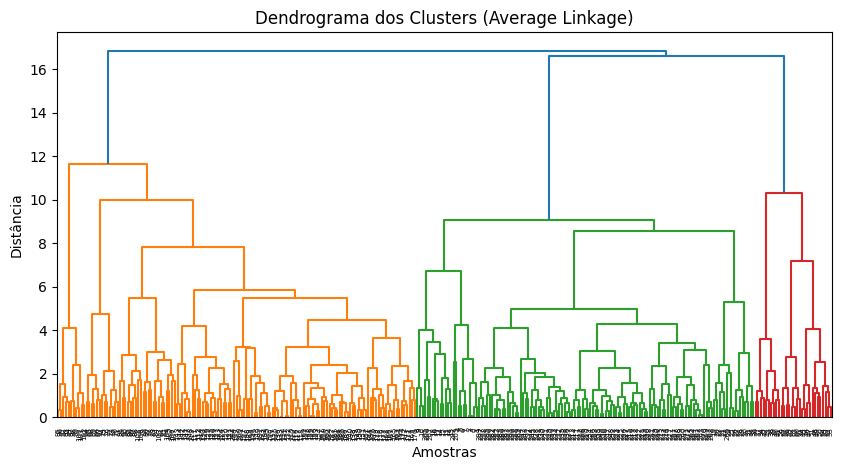

In [67]:
# Aplicando o algoritmo de ligação única
clustering = AgglomerativeClustering(n_clusters=7, linkage='average')
clusters = clustering.fit_predict(df_pathbased_X)

# Calculando a matriz de ligação com o algoritmo de ligação média
Z = linkage(df_pathbased_X, method='average')

# Plotando o dendrograma
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title('Dendrograma dos Clusters (Average Linkage)')
plt.xlabel('Amostras')
plt.ylabel('Distância')
plt.show()

# <a id="dataset_3_3"></a> 3.a.III Dataset Pathbased - DBSCAN

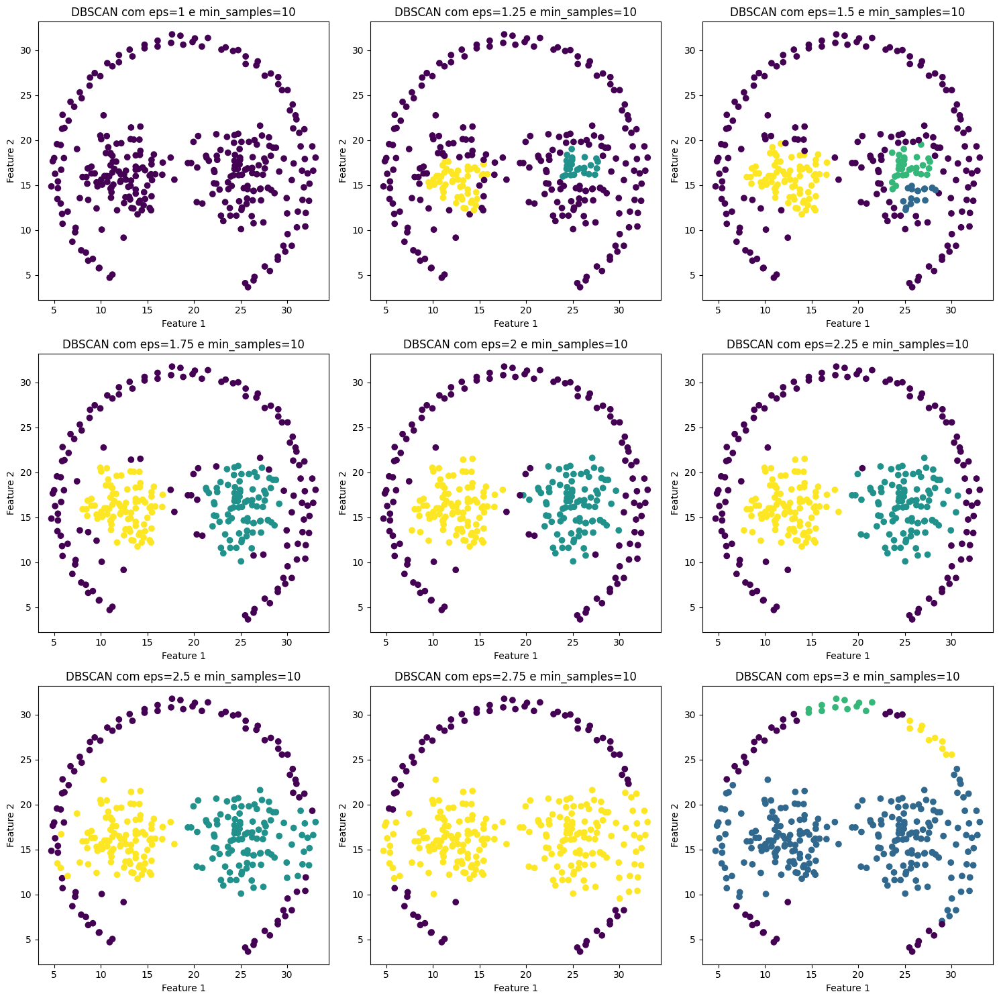

In [68]:
fig, axs = plt.subplots(3, 3, figsize=(15, 15))


epsilon_values = [1, 1.25, 1.5, 1.75, 2, 2.25, 2.5, 2.75, 3]


for k in range(2, 11):

    dbscan = DBSCAN(eps=epsilon_values[k-2], min_samples=10)
    clusters = dbscan.fit_predict(df_pathbased_X)

    # Plotando os clusters
    ax = axs[(k-2)//3][(k-2)%3]
    ax.scatter(df_pathbased_X.iloc[:, 0], df_pathbased_X.iloc[:, 1], c=clusters, cmap='viridis')
    ax.set_title(f'DBSCAN com eps={epsilon_values[k-2]} e min_samples=10')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

plt.tight_layout()
plt.show()

# <a id="dataset_3_4"></a> 3.a.IV Dataset Pathbased - Melhores Resultados

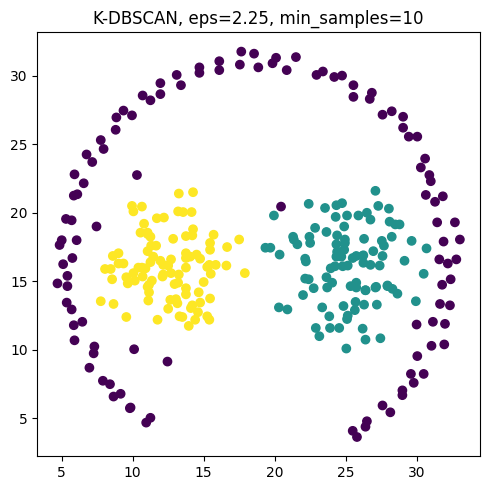

In [69]:
df_pathbased_X = df_pathbased_X.values
clustering = DBSCAN(eps=2.25, min_samples=10)
clusters_1 = clustering.fit_predict(df_pathbased_X)

plt.figure(figsize=(5, 5))
plt.scatter(df_pathbased_X[:,0], df_pathbased_X[:,1], c=clusters_1, cmap='viridis')
plt.title('K-DBSCAN, eps=2.25, min_samples=10')


plt.tight_layout()
plt.show()


---

# <a id="dataset_4"></a> 4.a. Dataset Flame

In [70]:
df_flame = pd.read_csv("flame.csv", sep=";", names=["x1","x2","y"])

In [71]:
df_flame

,x1,x2,y
0,1.85,27.80,1
1,1.35,26.65,1
2,1.40,23.25,2
3,0.85,23.05,2
4,0.50,22.35,2
...,...,...,...
235,7.50,26.20,1
236,7.50,25.65,1
237,7.05,25.85,1
238,6.90,27.15,1


In [72]:
df_flame_X = df_flame.drop("y", axis=1)
df_flame_Y = df_flame["y"]

# <a id="dataset_4_1"></a> 4.a.I Dataset Flame - K-means

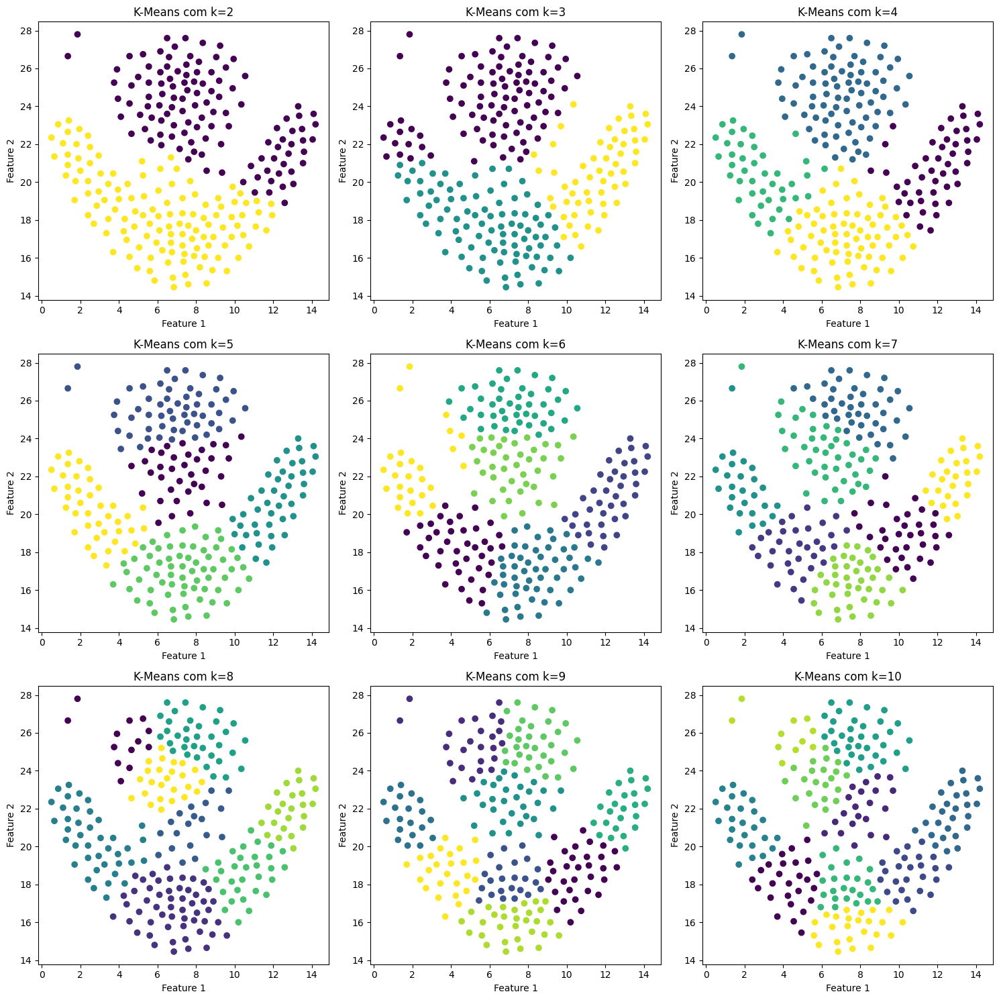

In [73]:
# Variando o número de clusters de 2 a 10
fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for k in range(2, 11):
    # Criando o objeto KMeans
    kmeans = KMeans(n_clusters=k)

    # Aplicando o algoritmo K-Means
    clusters = kmeans.fit_predict(df_flame_X)

    # Plotando os clusters
    ax = axs[(k-2)//3][(k-2)%3]
    ax.scatter(df_flame_X.iloc[:, 0], df_flame_X.iloc[:, 1], c=clusters, cmap='viridis')
    ax.set_title(f'K-Means com k={k}')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

plt.tight_layout()
plt.show()

# <a id="dataset_4_2"></a> 4.a.II Dataset Flame - Average Linkage

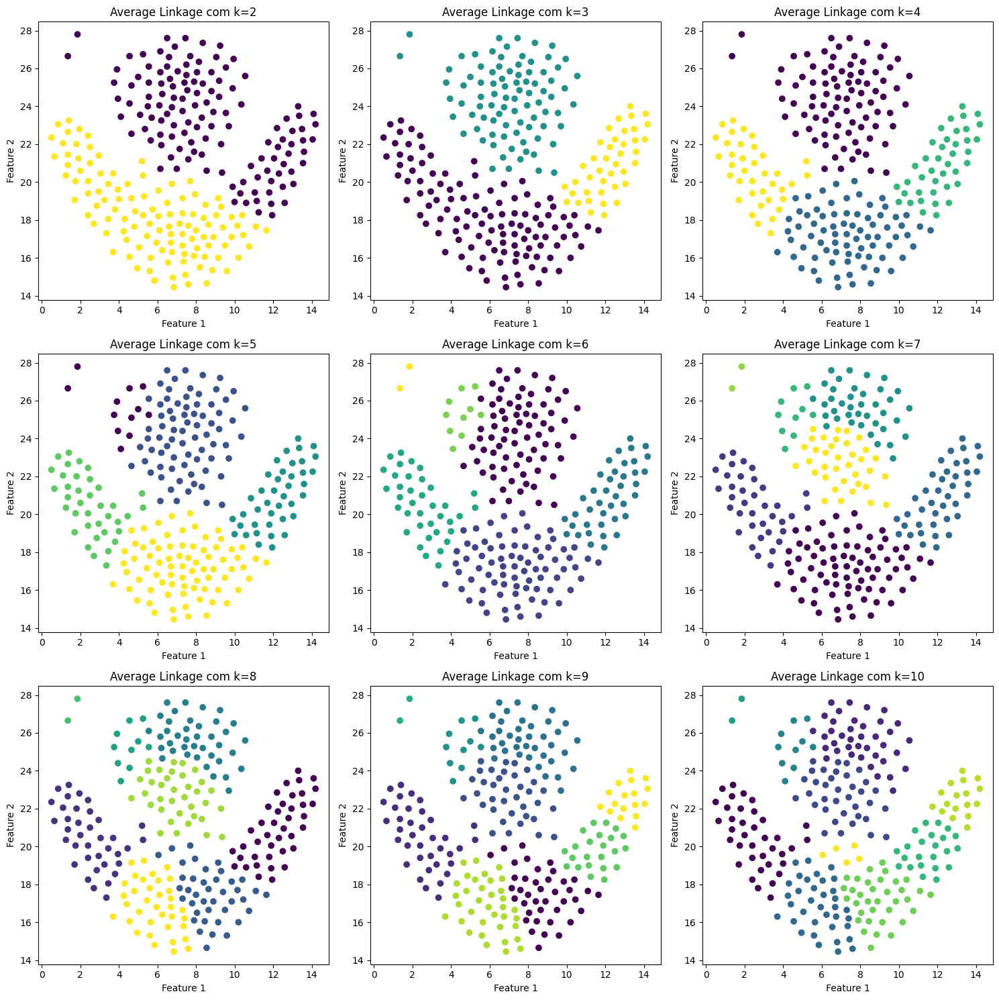

In [74]:
# Variando o número de clusters de 2 a 10
fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for k in range(2, 11):
    # Criando o objeto AgglomerativeClustering
    clustering = AgglomerativeClustering(n_clusters=k, linkage='average')

    # Aplicando o algoritmo AgglomerativeClustering
    clusters = clustering.fit_predict(df_flame_X)

    # Plotando os clusters
    ax = axs[(k-2)//3][(k-2)%3]
    ax.scatter(df_flame_X.iloc[:, 0], df_flame_X.iloc[:, 1], c=clusters, cmap='viridis')
    ax.set_title(f'Average Linkage com k={k}')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

plt.tight_layout()
plt.show()

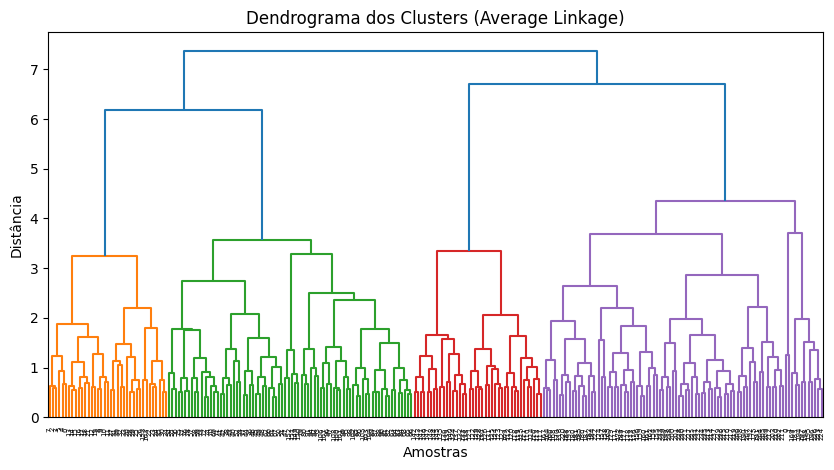

In [75]:
# Aplicando o algoritmo de ligação única
clustering = AgglomerativeClustering(n_clusters=4, linkage='average')
clusters = clustering.fit_predict(df_flame_X)

# Calculando a matriz de ligação com o algoritmo de ligação média
Z = linkage(df_flame_X, method='average')

# Plotando o dendrograma
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title('Dendrograma dos Clusters (Average Linkage)')
plt.xlabel('Amostras')
plt.ylabel('Distância')
plt.show()

# <a id="dataset_1_4"></a> 4.a.III Dataset Flame - DBSCAN

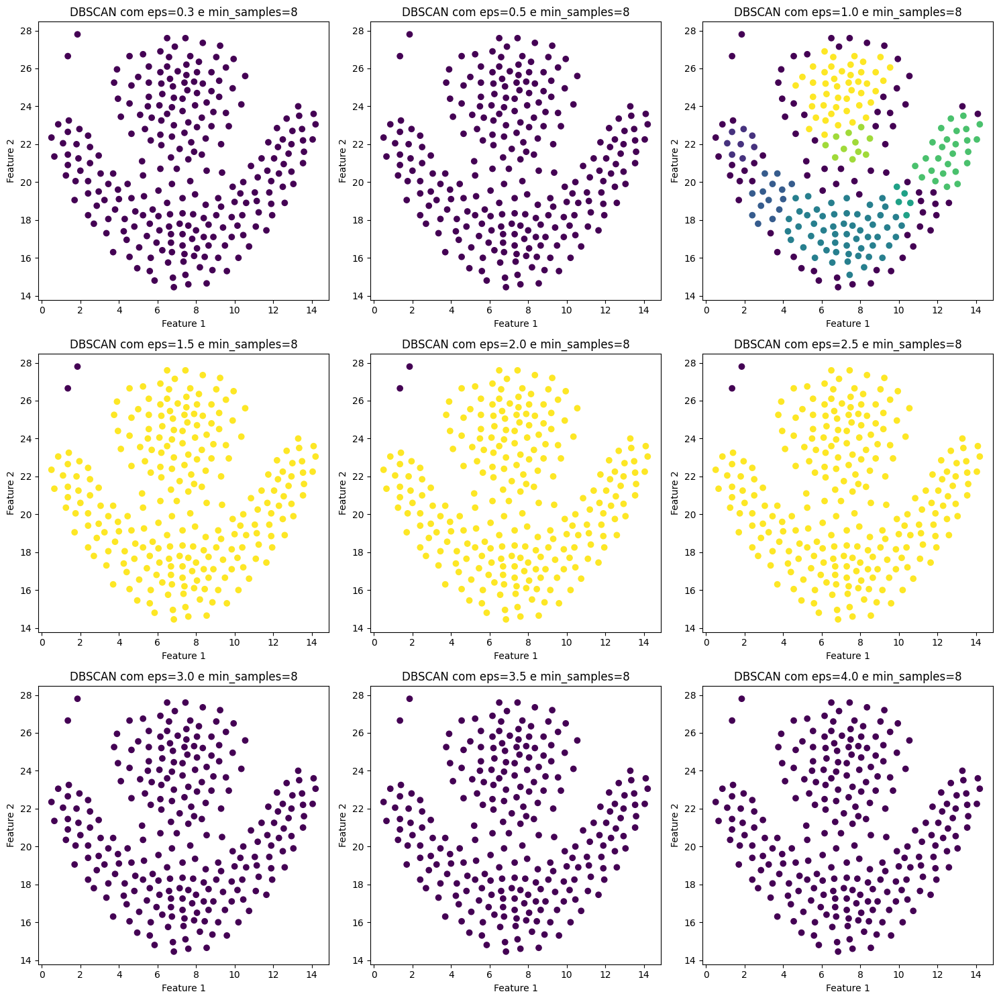

In [76]:
fig, axs = plt.subplots(3, 3, figsize=(15, 15))

epsilon_values = [0.3, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0]

for k in range(2, 11):

    dbscan = DBSCAN(eps=epsilon_values[k-2], min_samples=8)
    clusters = dbscan.fit_predict(df_flame_X)

    # Plotando os clusters
    ax = axs[(k-2)//3][(k-2)%3]
    ax.scatter(df_flame_X.iloc[:, 0], df_flame_X.iloc[:, 1], c=clusters, cmap='viridis')
    ax.set_title(f'DBSCAN com eps={epsilon_values[k-2]} e min_samples=8')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

plt.tight_layout()
plt.show()

# <a id="dataset_4_4"></a> 4.a.IV Dataset Flame - Melhores Resultados

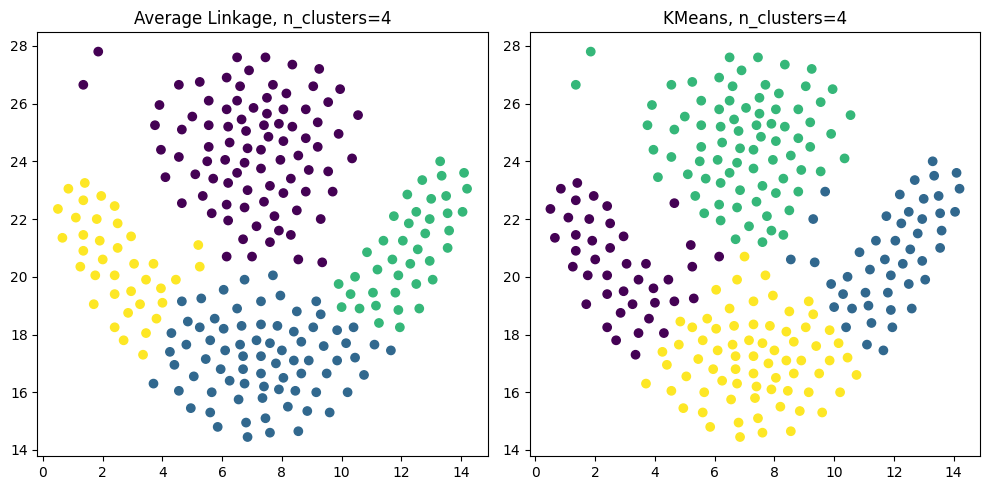

In [77]:
df_flame_X = df_flame_X.values

clustering = AgglomerativeClustering(n_clusters=4, linkage='average')
clusters_1 = clustering.fit_predict(df_flame_X)

dbscan = KMeans(n_clusters=4)
clusters_2 = dbscan.fit_predict(df_flame_X)

plt.figure(figsize=(10, 5))
plt.subplot(121)
plt.scatter(df_flame_X[:,0], df_flame_X[:,1], c=clusters_1, cmap='viridis')
plt.title('Average Linkage, n_clusters=4')

plt.subplot(122)
plt.scatter(df_flame_X[:,0], df_flame_X[:,1], c=clusters_2, cmap='viridis')
plt.title('KMeans, n_clusters=4')

plt.tight_layout()
plt.show()
